In [1]:
%pylab inline
import os
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    raise ImportError('install ipyvolume for display') 

import haloSim
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTaskNew

#important constant
C_LIGHT=2.99792458e8        # m/s
GNEWTON=6.67428e-11         # m^3/kg/s^2
KG_PER_SUN=1.98892e30       # kg/M_solar
M_PER_PARSEC=3.08568025e16  # m/pc

figMsDir='./'
datDir='/home/xiangchong/work/gw_ipmu/work/S16ACatalogs/'

Populating the interactive namespace from numpy and matplotlib


In [2]:
cd wrkDir/sim

/home/xiangchong/work/gw_ipmu/work/massMapSparse/sim


In [3]:
haloCat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
# Simulation
iz  =   1
im  =   5
isim=   0
mm=(haloCat['iz']==iz)&(haloCat['im']==im)
hh=haloCat[mm]

z_h=hh['zh']
log_m=hh['log10_M200']
M_200=   10.**(log_m)
conc =   6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
assert conc==hh['conc']

halo =   haloSim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
print('redshift is %.2f' %z_h)
print('logM is %.2f' %log_m)

redshift is 0.15
logM is 14.54


In [4]:
# load simualtion
ngroup  =   100
datU=Table.read('HSC-obs/20200328/stampSim_HSClike_mask_shapenoise_photoz-202003282257.fits')
ng=int(len(datU)//ngroup)
datU=datU[isim*ng:(isim+1)*ng]
lensKer= halo.lensKernel(datU['ztrue'])
shearR=  halo.DeltaSigmaComplex(datU['raR']*3600.,datU['decR']*3600.)*lensKer
shearH=  halo.DeltaSigmaComplex(datU['raH']*3600.,datU['decH']*3600.)*lensKer
Sigma=halo.Sigma(datU['raR']*3600.,datU['decR']*3600.)
datU['g1R']=shearR.real
datU['g2R']=shearR.imag
datU['g1H']=shearH.real
datU['g2H']=shearH.imag
datU['Sigma']=Sigma

In [5]:
# Pixelation
ver='pix96-ns10'
zer='zt' #pz/zt
ner='nn' #wn/nn
ver2='nl8-pc'
hdir='planck-cosmo/pre-run/%s/' %ver
odir='planck-cosmo/pre-run/%s/%s/' %(ver,ver2)

if not os.path.isdir(odir):
    os.mkdir(odir)

outfname1   =  os.path.join(hdir,'pixShearR-g1-%d-%d-%s-%s.fits' %(iz,im,zer,ner))
outfname2   =  os.path.join(hdir,'pixShearR-g2-%d-%d-%s-%s.fits' %(iz,im,zer,ner))
outfname3   =  os.path.join('HSC-obs/20200328/pixes','pixStd.fits')

# configuration
configName  =   'planck-cosmo/config-pix96-%s.ini' %ver2.split('-')[0]
parser      =   ConfigParser()
parser.read(configName)
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)

dtheta=parser.getfloat('transPlane','scale')*60. #arcsec
print('rs of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta))
print('r truncate of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta*halo.c))
print('the average density contrast should be %.3f.' %(halo.M/(halo.rs/halo.c)**2./np.pi/halo.Sigma_M_bin(0.51,0.56)))
gridInfo    =   cartesianGrid3D(parser)

if not os.path.isfile(outfname1):
    print('preparing the pixelation file')
    g1name  =   'g1R'
    g2name  =   'g2R'
    raname  =   'raR'
    decname =   'decR'
    if zer=='zt':
        zname   =   'ztrue'
    elif zer=='pz':
        zname   =   'zbest'
    if ner=='nn':
        val=(datU[g1name])+(datU[g2name])*1j
    elif ner=='wn':
        val=(datU[g1name]+datU['g1n'])+(datU[g2name]+datU['g2n'])*1j
    
    gridInfo.setupNaivePlane()
    out1=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val.real,ws=None)
    out2=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val.imag,ws=None)
    pyfits.writeto(outfname1,out1,overwrite=True)
    pyfits.writeto(outfname2,out2,overwrite=True)

## Noise variance
if not os.path.isfile(outfname3):
    print('preparing the noise std file')
    ngroup=100
    pixDatAll=np.zeros((ngroup,)+gridInfo.shape,dtype=np.complex128)
    for ig in range(ngroup):
        datU=datTab[ig*ng:(ig+1)*ng]
        g1name  =   'g1R'
        g2name  =   'g2R'
        raname  =   'raR'
        decname =   'decR'
        zname   =   'zbest'
        val=(datU[g1name]+datU['g1n'])+(datU[g2name]+datU['g2n'])*1j
        outcome=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val)
        pixDatAll[ig]=outcome
    pixSigmaErr=np.std(pixDatAll,axis=0)
    outfname3   =  os.path.join(hdir,'pixStd.fits')
    pyfits.writeto(outfname3,pixSigmaErr,overwrite=True)

rs of the input halo is 2.433 pixels.
r truncate of the input halo is 9.964 pixels.
the average density contrast should be 5.569.
preparing the pixelation file


In [6]:
gridInfo.zlbound

array([0.04 , 0.085, 0.13 , 0.175, 0.22 , 0.265, 0.31 , 0.355, 0.4  ])

In [7]:
outfname4   =  'lensing_kernel-%s-%s.fits' %(zer,ver.split('-')[1])
outfname4   =   os.path.join(odir,outfname4)
parser.set('prepare','lkfname',outfname4)
    
# lensing kernel
if not os.path.isfile(outfname4):
    print('preparing the lens kernel file')
    tn='9347.fits'
    cfn='%s/S16AStandardCalibrated/tract/%s' %(datDir,tn)
    cdata=pyfits.getdata(cfn)
    poz_best=cdata['mlz_photoz_best']
    pfn='%s/S16AStandardCalibrated/tract/%s_pofz.fits' %(datDir,tn.split('.')[0])
    poz_data=pyfits.getdata(pfn)['PDF']
    bfn='%s/S16AStandardV2/field/pz_pdf_bins_mlz.fits' %datDir
    poz_bins=pyfits.getdata(bfn)['BINS']
    if zer=='pz':
        lensKernel= gridInfo.lensing_kernel(poz_grids=poz_bins,poz_data=poz_data,poz_best=poz_best)
    elif zer=='zt':
        lensKernel= gridInfo.lensing_kernel()
    pyfits.writeto(outfname4,lensKernel,overwrite=True)
    
if False:
    noiName='../HSC-like-sim/sims/stampSim_HSClike_mask_shapenoise_photoz-202003282257.fits'
    noise=  pyfits.getdata(noiName)
    ngroup=100
    ng=int(len(noise)//ngroup)
    for ig in range(ngroup):
        datU=noise[ig*ng:(ig+1)*ng]
        fname='../HSC-like-sim/sims/shapenoise_photoz-202003282257/sim%d.fits' %ig
        pyfits.writeto(fname,datU,overwrite=True)
        
# Reconstruction Init
tau=0.0
lbd=3.5
parser.set('sparse','lbd','%s' %lbd )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','mu','2e-4')
parser.set('sparse','debugList','[]')
if 'pc' in ver2:
    parser.set('lensZ','atomFname','planck-cosmo/prior/haloBasis.fits')
    parser.set('sparse','nframe','1' )
else:
    parser.set('lensZ','resolve_lim','0.4') #pix
    parser.set('lensZ','rs_base','0.12')    #Mpc/h
    parser.set('sparse','nframe','3' )

a=pyfits.getdata(outfname3)
nz,ny,nx=a.shape
parser.set('transPlane','ny','%d' %ny)
parser.set('transPlane','nx','%d' %nx)
sparse3D    =   massmapSparsityTaskNew(parser)
print(sparse3D.mu)

0.0002


# sparse analysis

In [8]:
%%time
sparse3D.clean_outcome()
sparse3D.lbd=2.
sparse3D.lcd=0.1
sparse3D.fista_gradient_descent(1500)
outfname1=os.path.join(odir,'alphaRW-%d-%d-%s-%s-lasso-lbd%02d-lbc%02d.fits' %(iz,im,zer,ner,sparse3D.lbd*10,sparse3D.lcd*10))
pyfits.writeto(outfname1,sparse3D.alphaR,overwrite=True)
sparse3D.reconstruct()
outfname2=os.path.join(odir,'deltaR-%d-%d-%s-%s-lasso-lbd%02d-lbc%02d.fits' %(iz,im,zer,ner,sparse3D.lbd*10,sparse3D.lcd*10))
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)

CPU times: user 7.53 s, sys: 0 ns, total: 7.53 s
Wall time: 7.65 s


In [9]:
%%time
sparse3D.lbd=3.5
sparse3D.lcd=0.
sparse3D.mu=2e-4
w   =   sparse3D.adaptive_lasso_weight(gamma=2.,sm_scale=0.)
sparse3D.fista_gradient_descent(800,w=w)
sparse3D.reconstruct()
outfname2=os.path.join(odir,'deltaR-%d-%d-%s-%s-alasso-lbd35.fits' %(iz,im,zer,ner))
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)

CPU times: user 5.81 s, sys: 0 ns, total: 5.81 s
Wall time: 5.84 s


In [10]:
%%time
sparse3D.lbd=3.5
sparse3D.lcd=0.
sparse3D.mu=2e-4
w   =   sparse3D.adaptive_lasso_weight(gamma=2.,sm_scale=0.)
sparse3D.fista_gradient_descent(800,w=w)
sparse3D.reconstruct()
outfname2=os.path.join(odir,'deltaR-%d-%d-%s-%s-alasso-lbd35.fits' %(iz,im,zer,ner))
pyfits.writeto(outfname2,sparse3D.deltaR,overwrite=True)

CPU times: user 21.3 ms, sys: 0 ns, total: 21.3 ms
Wall time: 41.4 ms


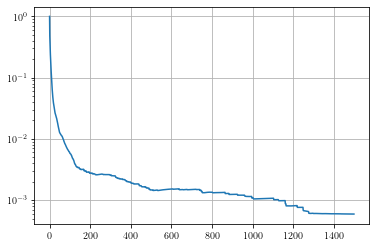

In [8]:
plt.plot(sparse3D.diff)
plt.yscale('log')
plt.grid()

In [10]:
figure=ipv.figure(controls=False)
vol1=ipv.volshow(sparse3D.deltaR,level=[0.95,0.50],opacity=[1.,0.3], \
    extent=[[-sparse3D.ny//2,sparse3D.nx//2],[-sparse3D.ny//2,sparse3D.nx//2],[0.01,0.86]],\
    controls=False)
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()

/work/xiangchong.li/lsstsw/miniconda/envs/lsst-scipipe/lib/python3.7/site-packages/ipyvolume/serialize.py:88: RuntimeWarning: invalid value encountered in true_divide
  grid_normalized = (grid * 1.0 - vmin) / (vmax - vmin)


In [23]:
spaceF  =   np.fft.fft2(np.ones((nz,ny,nx)))
# l2-norm in weighted space
fun     =   np.conj(sparse3D.dict2D.aframes)*sparse3D.dict2D.aframes
fun     =   np.fft.fft2(fun) #[nlp,nframe,ny,nx]
fun     =   fun[None,:,:,:,:]*spaceF[:,None,None,:,:]
asquareframe=np.fft.ifft2(fun).real
diagonal=  np.sum(asquareframe,axis=0)

array([[10., 10., 10., ..., 10., 10., 10.],
       [10., 10., 10., ..., 10., 10., 10.],
       [10., 10., 10., ..., 10., 10., 10.],
       ...,
       [10., 10., 10., ..., 10., 10., 10.],
       [10., 10., 10., ..., 10., 10., 10.],
       [10., 10., 10., ..., 10., 10., 10.]])

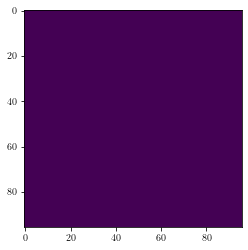

In [25]:
imshow(diagonal[0,0])
diagonal[0,0]

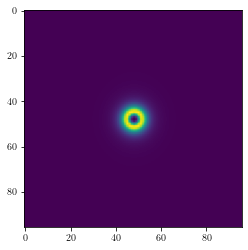

In [20]:
fun     =   np.conj(sparse3D.dict2D.aframes)*sparse3D.dict2D.aframes
imshow(np.fft.fftshift(fun[7,0].real))

In [23]:
atFname =   'planck-cosmo/prior/haloBasis.fits'
tmp     =   pyfits.getdata(atFname)
tmp     =   np.fft.fftshift(tmp)
nzl,nframe,nyt,nxt =   tmp.shape
ypad    =   (sparse3D.ny-nyt)//2
xpad    =   (sparse3D.nx-nxt)//2
ppad    =   ((0,0),(0,0),(ypad,ypad),(xpad,xpad))
tmp     =   np.fft.ifftshift(np.pad(tmp,ppad))

0.18836647454505556

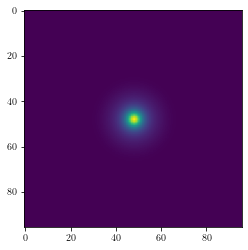

In [29]:
imshow(np.fft.fftshift(tmp[0,0]))
np.max(tmp[0,0])

In [26]:
tmp[0,0,0,0]

0.18836647454505556

In [33]:
pyfits.writeto('/home/xiangchong/aaa.fits',sparse3D.sigmaA,overwrite=True)
pyfits.writeto('/home/xiangchong/aaa-dia.fits',sparse3D.diagonal,overwrite=True)
pyfits.writeto('/home/xiangchong/aaa-s.fits',sparse3D.sigmaSInv**2.,overwrite=True)

In [32]:
sparse3D.shapeA

(8, 1, 96, 96)

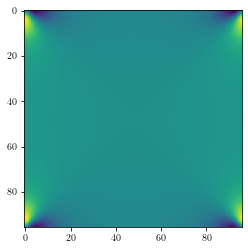

In [39]:
imshow(sparse3D.dict2D.aframes[0,0].real)